In [1]:

import numpy as np 
import pandas as pd 


import os



In [2]:
from keras.utils import np_utils
from tensorflow.keras.models import Model, Sequential, load_model
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Reshape, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet50 import ResNet50
from sklearn.metrics import confusion_matrix, classification_report
import itertools
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [3]:
from keras.applications.vgg16 import VGG16

In [4]:
from keras.applications.vgg19 import VGG19

In [5]:
from tensorflow.keras.utils import to_categorical

In [6]:

img_rows = 224
img_cols = 224
input_shape = (img_rows,img_cols,3)
epochs = 10
batch_size = 64


In [7]:

def getResNet50Model(lastFourTrainable=False):
    resnet_model = ResNet50(weights='imagenet', input_shape=input_shape, include_top=True)
  
    for layer in resnet_model.layers[:]:
        layer.trainable = False
  
    output = resnet_model.get_layer('avg_pool').output
    output = Flatten(name='new_flatten')(output)
    output = Dense(units=1024, activation='relu', name='new_fc')(output)
    predictions = Dense(units=50, activation='softmax')(output)
    resnet_model = Model(resnet_model.input, predictions)
   
    if lastFourTrainable == True:
        resnet_model.get_layer('conv5_block3_2_bn').trainable = True
        resnet_model.get_layer('conv5_block3_3_conv').trainable = True
        resnet_model.get_layer('conv5_block3_3_bn').trainable = True
        resnet_model.get_layer('new_fc').trainable = True
   
    resnet_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    resnet_model.summary()
    return resnet_model

In [8]:
traindf = pd.read_csv("../input/landmark-recognition-2021/train.csv")
traindf.head()

,id,landmark_id
0,17660ef415d37059,1
1,92b6290d571448f6,1
2,cd41bf948edc0340,1
3,fb09f1e98c6d2f70,1
4,25c9dfc7ea69838d,7


In [9]:
traindf.shape

(1580470, 2)

In [10]:
landmark_unique = traindf['landmark_id'].unique()
len(landmark_unique)

81313

In [11]:
landmark_unique[0:50]

array([  1,   7,   9,  11,  12,  17,  22,  23,  24,  27,  29,  30,  32,
        34,  36,  37,  41,  43,  48,  50,  51,  56,  58,  60,  63,  65,
        66,  72,  79,  81,  82,  83,  84,  87,  89,  90,  99, 100, 101,
       103, 104, 110, 111, 115, 117, 118, 123, 124, 131, 134])

In [12]:
image_ids = []
labels = []
temp_labels = []
i=0
for id_ in landmark_unique[0:50]:
    for iid in traindf['id'][traindf['landmark_id'] == id_]:
        image_ids.append(iid)
        labels.append(id_)
        temp_labels.append(i)
    i = i+1
len(image_ids)

1144

In [ ]:
# In this competition, you are asked to take test images and recognize which landmarks (if any) are depicted in them. 
# The training set is available in the train/ folder, with corresponding landmark labels in train.csv. 
# The test set images are listed in the test/ folder. Each image has a unique id. 
# Since there are a large number of images, each image is placed within three subfolders according to the first three characters of the image id
#  (i.e. image_id abcdef.jpg is placed in a/b/c/abcdef.jpg).

In [13]:
mainpath = '../input/landmark-recognition-2021/train'
image_path = []
images_pixels = []

for i in range(0,len(image_ids)):
    first_dir = os.path.join(mainpath,image_ids[i][0])
    second_dir = os.path.join(first_dir,image_ids[i][1])
    third_dir = os.path.join(second_dir,image_ids[i][2])
    finalpath = os.path.join(third_dir,image_ids[i]+'.jpg')
    
    img_pix = cv2.imread(finalpath,1)
    images_pixels.append(cv2.resize(img_pix, (224,224)))
    
    image_path.append(finalpath)

In [14]:
print('Images: ', len(image_path))
print('Image labels: ', len(labels))

Images:  1144
Image labels:  1144


In [15]:
print(temp_labels)

[0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 8, 8, 8, 8, 8, 8, 8, 8, 8, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 

In [16]:
import random

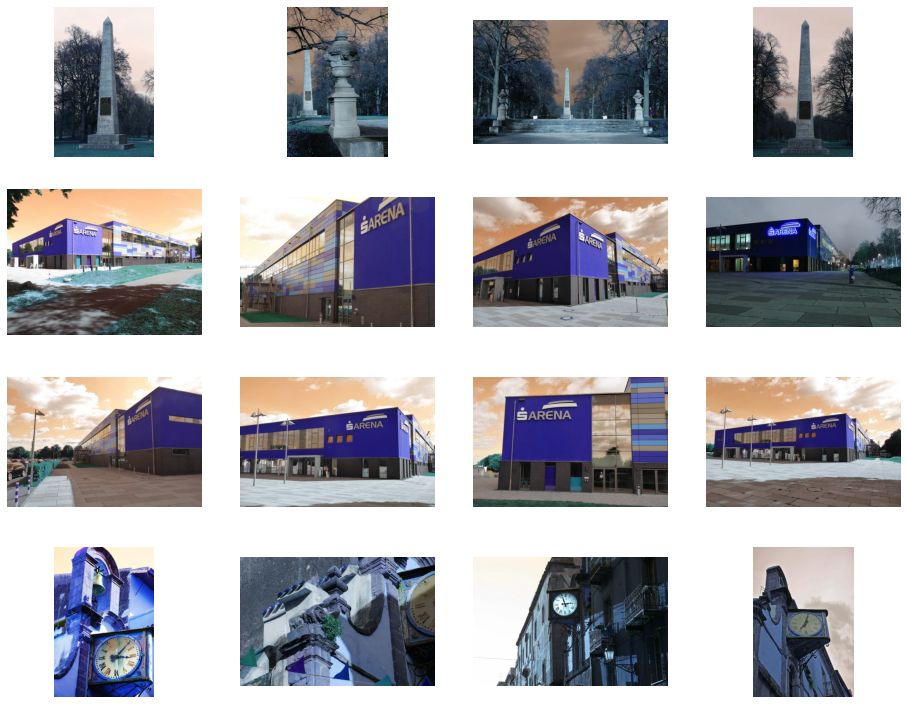

In [17]:
fig = plt.gcf()
fig.set_size_inches(16, 16)

next_pix_ = image_path

for i, img_path in enumerate(next_pix_[0:16]):
    
    sp = plt.subplot(5, 4, i + 1)
    sp.axis('Off')

    img = cv2.imread(img_path)
    plt.imshow(img)

plt.show()

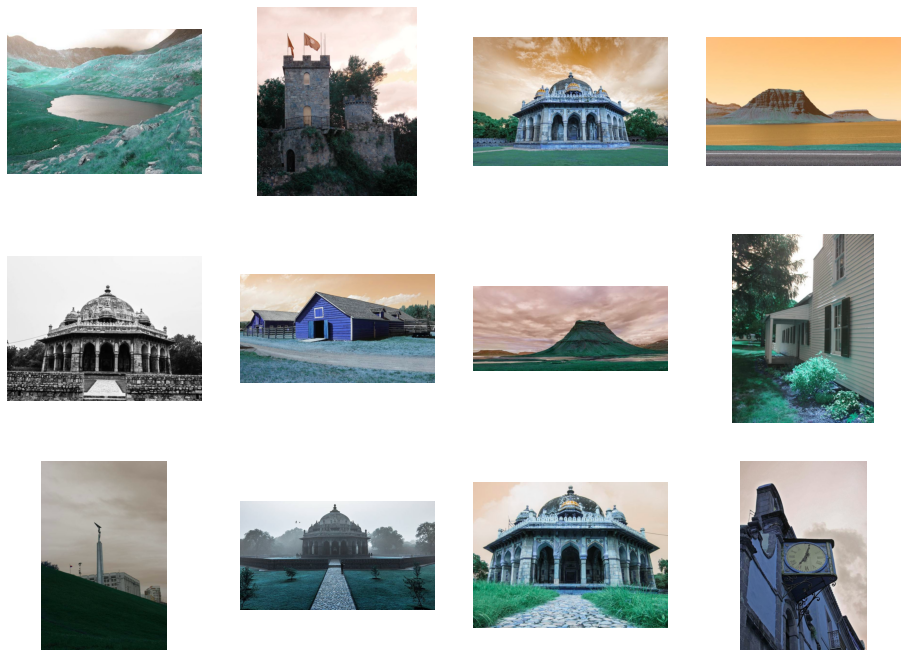

In [18]:
fig = plt.gcf()
fig.set_size_inches(16, 16)

next_pix = image_path
random.shuffle(next_pix)

for i, img_path in enumerate(next_pix[0:12]):
    
    sp = plt.subplot(4, 4, i + 1)
    sp.axis('Off')

    img = cv2.imread(img_path)
    plt.imshow(img)

plt.show()

In [19]:
shuf = list(zip(images_pixels,temp_labels))
random.shuffle(shuf)

train_data, labels_data = zip(*shuf)
print('Images: ', len(train_data))
print('Image labels: ', len(labels_data))

Images:  1144
Image labels:  1144


In [20]:
print(labels_data)

(9, 9, 9, 35, 2, 9, 44, 9, 9, 27, 43, 9, 9, 38, 9, 17, 31, 9, 43, 22, 9, 22, 9, 44, 9, 9, 29, 9, 43, 9, 38, 9, 9, 9, 8, 9, 12, 9, 9, 9, 9, 17, 25, 47, 9, 47, 9, 43, 36, 9, 38, 26, 9, 16, 4, 47, 2, 17, 7, 9, 9, 5, 9, 27, 47, 9, 9, 3, 9, 46, 12, 44, 26, 29, 47, 9, 17, 44, 20, 22, 10, 9, 9, 9, 34, 4, 9, 9, 16, 9, 9, 35, 11, 9, 17, 36, 9, 9, 9, 9, 9, 9, 24, 15, 9, 47, 9, 4, 9, 37, 9, 27, 18, 9, 9, 6, 19, 43, 9, 9, 26, 9, 43, 47, 15, 17, 19, 7, 9, 9, 37, 9, 9, 15, 9, 11, 17, 9, 15, 43, 40, 17, 36, 47, 23, 29, 9, 23, 9, 9, 31, 28, 3, 9, 44, 9, 9, 22, 3, 43, 17, 47, 44, 9, 22, 6, 44, 29, 9, 9, 17, 9, 15, 17, 42, 3, 26, 47, 9, 25, 40, 42, 9, 9, 9, 9, 9, 0, 47, 9, 14, 9, 34, 28, 9, 17, 12, 9, 3, 9, 47, 19, 44, 9, 36, 9, 9, 22, 49, 37, 9, 29, 31, 36, 9, 9, 9, 15, 31, 49, 43, 9, 9, 44, 9, 9, 9, 47, 35, 9, 9, 2, 9, 7, 9, 9, 9, 7, 29, 2, 29, 18, 9, 38, 9, 12, 9, 9, 9, 9, 9, 21, 22, 9, 48, 9, 43, 30, 47, 9, 9, 9, 9, 9, 9, 17, 46, 38, 34, 9, 36, 28, 9, 33, 42, 9, 19, 9, 9, 9, 15, 9, 9, 18, 4, 9, 30, 

In [23]:
train_data = np.array(train_data) #/ 255


In [24]:
a = np.array(labels_data)
a_pd = pd.get_dummies(a).astype('float32').values 

In [25]:
print(labels_data[0:6])

(9, 9, 9, 35, 2, 9)


In [26]:
print(a_pd)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [27]:
labels_data=a_pd

In [28]:
print(labels_data[0:5])

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0.]]


In [29]:
labels_data.shape

(1144, 50)

In [30]:
from sklearn.model_selection import train_test_split

X_train, X_test, Y_train, Y_test = train_test_split(train_data, labels_data, test_size = 0.3, random_state=101)

print("X train data : ", len(X_train))
print("X label data : ", len(X_test))
print("Y test data : ", len(Y_train))
print("Y label data : ", len(Y_test))

X train data :  800
X label data :  344
Y test data :  800
Y label data :  344


In [31]:
num_sample=X_train.shape[0]
validation_freq=int(num_sample*0.2)
validationlist = random.sample(range(0, num_sample), validation_freq)
traininglist=list(set(range(0,num_sample))-set(validationlist))
print("No interesection between validationlist and traininglist:",set(traininglist).intersection(validationlist))

No interesection between validationlist and traininglist: set()


In [32]:
train_x_final=[]
train_y_final=[]
for val in traininglist:
    train_x_final.append(X_train[val])
    train_y_final.append(Y_train[val])
train_x_final=np.array(train_x_final)
train_y_final=np.array(train_y_final)
print("Training data shape",train_x_final.shape)
print("Training label shape",train_y_final.shape)

Training data shape (640, 224, 224, 3)
Training label shape (640, 50)


In [33]:
validation_x_final=[]
validation_y_final=[]
for val in validationlist:
    validation_x_final.append(X_train[val])
    validation_y_final.append(Y_train[val])
validation_x_final=np.array(validation_x_final)
validation_y_final=np.array(validation_y_final)
print("Validation data shape",validation_x_final.shape)
print("Validation label shape",validation_y_final.shape)

Validation data shape (160, 224, 224, 3)
Validation label shape (160, 50)


In [34]:

def plot_hist(history,title):
    plt.subplot(121)
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title(str(title)+' accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')

    plt.subplot(122)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title(str(title)+' loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')
    plt.show()

In [ ]:
# we made our 2 nsd model same as resnet 50
# it is vgg 16

In [35]:

def getVGG16Model(lastFourTrainable=False):
    vgg_model = VGG16(weights='imagenet', input_shape=input_shape, include_top=True)
    
    for layer in vgg_model.layers[:]:
        layer.trainable = False

    output = vgg_model.get_layer('fc2').output
    output = Flatten(name='new_flatten')(output)
    output = Dense(units=1024, activation='relu', name='new_fc')(output)
    output = Dense(units=50, activation='softmax')(output)
    vgg_model = Model(vgg_model.input, output)
   
    if lastFourTrainable == True:
        vgg_model.get_layer('block5_conv3').trainable = True
        vgg_model.get_layer('fc1').trainable = True
        vgg_model.get_layer('fc2').trainable = True
        vgg_model.get_layer('new_fc').trainable = True
 
    vgg_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    vgg_model.summary()

    return vgg_model

In [3]:

from keras.applications.vgg16 import VGG16

vgg_model = VGG16(weights='imagenet', input_shape=(224,224,3), include_top=True)
vgg_model.summary()



Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

In [ ]:
# our 3 rd model

In [36]:

def getVGG19Model(lastFourTrainable=False):
    vgg_model_19 = VGG19(weights='imagenet', input_shape=input_shape, include_top=True)

    for layer in vgg_model_19.layers[:]:
        layer.trainable = False
   
    output = vgg_model_19.get_layer('fc2').output
    output = Flatten(name='new_flatten')(output)
    output = Dense(units=1024, activation='relu', name='new_fc')(output)
    output = Dense(units=50, activation='softmax')(output)
    vgg_model_19 = Model(vgg_model_19.input, output)
  
    if lastFourTrainable == True:
        vgg_model_19.get_layer('block5_conv3').trainable = True
        vgg_model_19.get_layer('fc1').trainable = True
        vgg_model_19.get_layer('fc2').trainable = True
        vgg_model_19.get_layer('new_fc').trainable = True

    vgg_model_19.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    vgg_model_19.summary()

    return vgg_model_19

In [37]:
vgg_model19_a = getVGG19Model(lastFourTrainable=False)

574726144/574710816 [==============================] - 16s 0us/step
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
___________________________________________________________

In [38]:
vgg_model19_b = getVGG19Model(lastFourTrainable=True)

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0   

In [39]:
# Get ResNet-50 Model with lastFourTrainable=False
resnet_model_a = getResNet50Model(lastFourTrainable=False)

102981632/102967424 [==============================] - 1s 0us/step
Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_3[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
_________________________

In [40]:
def score_train(model,test_x,test_y):
   
    train_scores = model.evaluate(test_x, test_y, verbose=1)
    print('Test loss:', train_scores[0])
    print('Test accuracy:', train_scores[1])

In [41]:
from tensorflow.keras.optimizers import Adam

In [42]:
print(validation_x_final.shape)
print(validation_y_final.shape)

(160, 224, 224, 3)
(160, 50)


In [43]:
import tensorflow

In [44]:
train_x_final_resnet=tensorflow.keras.applications.resnet.preprocess_input(train_x_final)
validation_x_final_resnet=tensorflow.keras.applications.resnet.preprocess_input(validation_x_final)

In [45]:
test_x_final_resnet=tensorflow.keras.applications.resnet.preprocess_input(X_test)


RESNET-50-a

In [46]:

history1 = resnet_model_a.fit(train_x_final_resnet, train_y_final, epochs=30,validation_data=(validation_x_final_resnet, validation_y_final))


Epoch 1/30
20/20 [==============================] - 12s 132ms/step - loss: 2.5118 - accuracy: 0.5391 - val_loss: 1.5350 - val_accuracy: 0.6687
Epoch 2/30
20/20 [==============================] - 1s 76ms/step - loss: 0.4557 - accuracy: 0.8938 - val_loss: 1.2793 - val_accuracy: 0.7812
Epoch 3/30
20/20 [==============================] - 1s 75ms/step - loss: 0.1285 - accuracy: 0.9641 - val_loss: 1.1440 - val_accuracy: 0.8000
Epoch 4/30
20/20 [==============================] - 1s 74ms/step - loss: 0.0428 - accuracy: 0.9891 - val_loss: 1.1715 - val_accuracy: 0.8062
Epoch 5/30
20/20 [==============================] - 1s 74ms/step - loss: 0.0137 - accuracy: 1.0000 - val_loss: 1.1422 - val_accuracy: 0.8250
Epoch 6/30
20/20 [==============================] - 2s 76ms/step - loss: 0.0067 - accuracy: 1.0000 - val_loss: 1.1075 - val_accuracy: 0.8375
Epoch 7/30
20/20 [==============================] - 2s 77ms/step - loss: 0.0047 - accuracy: 1.0000 - val_loss: 1.1086 - val_accuracy: 0.8313
Epoch 8/30


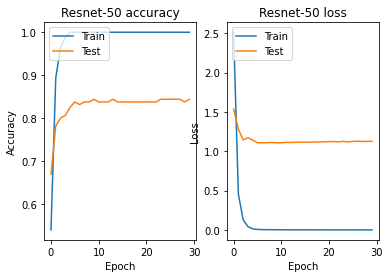

In [47]:
plot_hist(history1,'Resnet-50')

In [48]:
score_train(resnet_model_a,test_x_final_resnet,Y_test)

11/11 [==============================] - 2s 77ms/step - loss: 0.6324 - accuracy: 0.8750
Test loss: 0.6324113607406616
Test accuracy: 0.875


Resnet-50-b

In [49]:
resnet_model_b = getResNet50Model(lastFourTrainable=True)

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_4[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
____________________________________________________________________________________________

In [50]:

history = resnet_model_b.fit(train_x_final_resnet, train_y_final, epochs=30,validation_data=(validation_x_final_resnet, validation_y_final))


Epoch 1/30
20/20 [==============================] - 5s 135ms/step - loss: 2.1501 - accuracy: 0.5750 - val_loss: 1.5244 - val_accuracy: 0.7000
Epoch 2/30
20/20 [==============================] - 1s 75ms/step - loss: 0.2950 - accuracy: 0.9375 - val_loss: 1.2371 - val_accuracy: 0.7875
Epoch 3/30
20/20 [==============================] - 1s 75ms/step - loss: 0.0520 - accuracy: 0.9906 - val_loss: 1.1789 - val_accuracy: 0.7937
Epoch 4/30
20/20 [==============================] - 2s 78ms/step - loss: 0.0121 - accuracy: 1.0000 - val_loss: 1.1246 - val_accuracy: 0.8125
Epoch 5/30
20/20 [==============================] - 2s 80ms/step - loss: 0.0033 - accuracy: 1.0000 - val_loss: 1.0797 - val_accuracy: 0.8125
Epoch 6/30
20/20 [==============================] - 2s 76ms/step - loss: 0.0021 - accuracy: 1.0000 - val_loss: 1.0701 - val_accuracy: 0.8250
Epoch 7/30
20/20 [==============================] - 2s 78ms/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 1.0656 - val_accuracy: 0.8188
Epoch 8/30
2

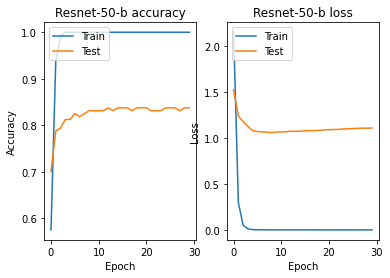

In [51]:
plot_hist(history,'Resnet-50-b')

In [52]:
score_train(resnet_model_b,test_x_final_resnet,Y_test)

11/11 [==============================] - 2s 62ms/step - loss: 0.6379 - accuracy: 0.8808
Test loss: 0.6378781795501709
Test accuracy: 0.8808139562606812


VGG-16-a

In [53]:
train_x_final_vgg16=tensorflow.keras.applications.vgg16.preprocess_input(train_x_final)
validation_x_final_vgg16=tensorflow.keras.applications.vgg16.preprocess_input(validation_x_final)


In [54]:
test_x_final_vgg16=tensorflow.keras.applications.vgg16.preprocess_input(X_test)

In [55]:
vgga=getVGG16Model(lastFourTrainable=False)


553476096/553467096 [==============================] - 3s 0us/step
Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
__________________________________________________________

In [56]:
history = vgga.fit(train_x_final_vgg16, train_y_final,validation_data=(validation_x_final_vgg16,validation_y_final), epochs=30)


Epoch 1/30
20/20 [==============================] - 6s 131ms/step - loss: 3.2165 - accuracy: 0.5422 - val_loss: 1.4608 - val_accuracy: 0.6687
Epoch 2/30
20/20 [==============================] - 2s 87ms/step - loss: 0.3583 - accuracy: 0.9047 - val_loss: 1.2797 - val_accuracy: 0.7875
Epoch 3/30
20/20 [==============================] - 2s 101ms/step - loss: 0.0661 - accuracy: 0.9859 - val_loss: 1.3401 - val_accuracy: 0.7750
Epoch 4/30
20/20 [==============================] - 2s 85ms/step - loss: 0.0165 - accuracy: 0.9984 - val_loss: 1.2632 - val_accuracy: 0.7875
Epoch 5/30
20/20 [==============================] - 2s 100ms/step - loss: 0.0051 - accuracy: 1.0000 - val_loss: 1.2662 - val_accuracy: 0.8062
Epoch 6/30
20/20 [==============================] - 2s 101ms/step - loss: 0.0021 - accuracy: 1.0000 - val_loss: 1.2878 - val_accuracy: 0.8125
Epoch 7/30
20/20 [==============================] - 2s 101ms/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 1.2955 - val_accuracy: 0.8000
Epoch 8/

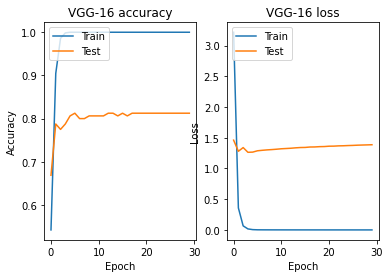

In [57]:
plot_hist(history,'VGG-16')

In [58]:
score_train(vgga,test_x_final_vgg16,Y_test)

11/11 [==============================] - 3s 290ms/step - loss: 0.8151 - accuracy: 0.8576
Test loss: 0.8150742053985596
Test accuracy: 0.8575581312179565


In [59]:
vggb=getVGG16Model(lastFourTrainable=True)

Model: "model_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0   

In [60]:
history_vgg16_b = vggb.fit(train_x_final_vgg16, train_y_final,validation_data=(validation_x_final_vgg16,validation_y_final), epochs=30)

Epoch 1/30
20/20 [==============================] - 3s 134ms/step - loss: 13.6887 - accuracy: 0.3063 - val_loss: 2.5028 - val_accuracy: 0.4125
Epoch 2/30
20/20 [==============================] - 2s 96ms/step - loss: 2.0295 - accuracy: 0.5250 - val_loss: 2.3863 - val_accuracy: 0.4812
Epoch 3/30
20/20 [==============================] - 2s 113ms/step - loss: 1.2027 - accuracy: 0.7000 - val_loss: 2.3887 - val_accuracy: 0.5750
Epoch 4/30
20/20 [==============================] - 2s 97ms/step - loss: 0.6308 - accuracy: 0.8531 - val_loss: 2.3439 - val_accuracy: 0.5750
Epoch 5/30
20/20 [==============================] - 2s 114ms/step - loss: 0.4912 - accuracy: 0.8859 - val_loss: 2.4417 - val_accuracy: 0.6313
Epoch 6/30
20/20 [==============================] - 2s 98ms/step - loss: 0.9533 - accuracy: 0.8859 - val_loss: 2.8481 - val_accuracy: 0.5188
Epoch 7/30
20/20 [==============================] - 2s 96ms/step - loss: 0.4267 - accuracy: 0.9281 - val_loss: 3.1437 - val_accuracy: 0.6187
Epoch 8/3

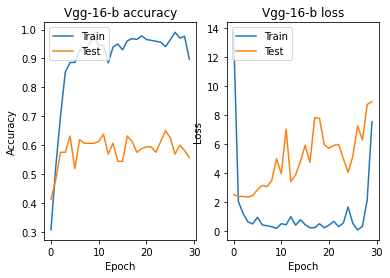

In [61]:
plot_hist(history_vgg16_b,'Vgg-16-b')

In [62]:
score_train(vggb,test_x_final_vgg16,Y_test)

11/11 [==============================] - 1s 66ms/step - loss: 9.3687 - accuracy: 0.5407
Test loss: 9.368698120117188
Test accuracy: 0.5406976938247681


VGG-19-a

In [63]:
train_x_final_vgg19=tensorflow.keras.applications.vgg19.preprocess_input(train_x_final)
validation_x_final_vgg19=tensorflow.keras.applications.vgg19.preprocess_input(validation_x_final)

In [64]:
test_x_final_vgg19=tensorflow.keras.applications.vgg19.preprocess_input(X_test)


In [65]:
history_vgg19_a = vgg_model19_a.fit(train_x_final_vgg19, train_y_final,validation_data=(validation_x_final_vgg19,validation_y_final), epochs=30)

Epoch 1/30
20/20 [==============================] - 3s 122ms/step - loss: 2.6144 - accuracy: 0.5750 - val_loss: 1.5406 - val_accuracy: 0.6938
Epoch 2/30
20/20 [==============================] - 2s 111ms/step - loss: 0.2927 - accuracy: 0.9297 - val_loss: 1.1899 - val_accuracy: 0.7688
Epoch 3/30
20/20 [==============================] - 2s 99ms/step - loss: 0.0617 - accuracy: 0.9937 - val_loss: 1.2650 - val_accuracy: 0.7625
Epoch 4/30
20/20 [==============================] - 2s 101ms/step - loss: 0.0099 - accuracy: 1.0000 - val_loss: 1.1578 - val_accuracy: 0.8062
Epoch 5/30
20/20 [==============================] - 2s 112ms/step - loss: 0.0055 - accuracy: 1.0000 - val_loss: 1.1784 - val_accuracy: 0.8000
Epoch 6/30
20/20 [==============================] - 2s 112ms/step - loss: 0.0024 - accuracy: 1.0000 - val_loss: 1.2053 - val_accuracy: 0.7875
Epoch 7/30
20/20 [==============================] - 2s 99ms/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 1.2238 - val_accuracy: 0.7937
Epoch 8/

In [66]:
score_train(vgg_model19_a,test_x_final_vgg19,Y_test)

11/11 [==============================] - 1s 78ms/step - loss: 0.9660 - accuracy: 0.8314
Test loss: 0.9660301208496094
Test accuracy: 0.8313953280448914


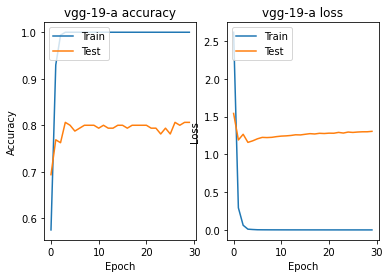

In [67]:
plot_hist(history_vgg19_a,'vgg-19-a')

VGG-19-b

In [68]:
history_vgg19_b = vgg_model19_b.fit(train_x_final_vgg19, train_y_final,validation_data=(validation_x_final_vgg19,validation_y_final), epochs=30)

Epoch 1/30
20/20 [==============================] - 3s 136ms/step - loss: 7.2513 - accuracy: 0.3531 - val_loss: 2.8037 - val_accuracy: 0.4125
Epoch 2/30
20/20 [==============================] - 2s 113ms/step - loss: 2.3541 - accuracy: 0.5047 - val_loss: 2.7335 - val_accuracy: 0.4187
Epoch 3/30
20/20 [==============================] - 2s 126ms/step - loss: 2.0987 - accuracy: 0.5125 - val_loss: 2.9447 - val_accuracy: 0.4437
Epoch 4/30
20/20 [==============================] - 3s 128ms/step - loss: 1.9209 - accuracy: 0.5406 - val_loss: 2.7295 - val_accuracy: 0.4313
Epoch 5/30
20/20 [==============================] - 3s 129ms/step - loss: 1.7965 - accuracy: 0.5609 - val_loss: 2.7323 - val_accuracy: 0.4500
Epoch 6/30
20/20 [==============================] - 2s 126ms/step - loss: 1.6750 - accuracy: 0.5938 - val_loss: 2.8209 - val_accuracy: 0.4375
Epoch 7/30
20/20 [==============================] - 2s 113ms/step - loss: 1.6486 - accuracy: 0.6031 - val_loss: 3.5773 - val_accuracy: 0.4437
Epoch 

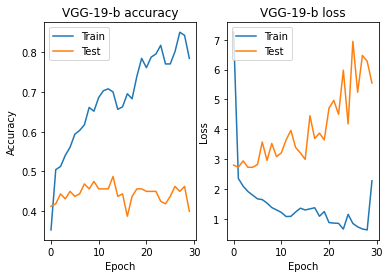

In [69]:
plot_hist(history_vgg19_b,'VGG-19-b')

In [70]:
score_train(vgg_model19_b,test_x_final_vgg19,Y_test)

11/11 [==============================] - 1s 79ms/step - loss: 5.2598 - accuracy: 0.4215
Test loss: 5.259844779968262
Test accuracy: 0.42151162028312683


DenseNet

In [71]:
from keras.applications.densenet import DenseNet121

In [72]:

def getDenseNet121Model(lastFourTrainable=False):
    densenet_model = DenseNet121(weights='imagenet', input_shape=input_shape, include_top=True)
   
    for layer in densenet_model.layers[:]:
        layer.trainable = False
    
    output = densenet_model.get_layer('avg_pool').output
    output = Flatten(name='new_flatten')(output)
    output = Dense(units=1024, activation='relu', name='new_fc')(output)
    predictions = Dense(units=50, activation='softmax')(output)
    densenet_model = Model(densenet_model.input, predictions)
   
    if lastFourTrainable == True:
        densenet_model.get_layer('conv5_block3_2_bn').trainable = True
        densenet_model.get_layer('conv5_block3_3_conv').trainable = True
        densenet_model.get_layer('conv5_block3_3_bn').trainable = True
        densenet_model.get_layer('new_fc').trainable = True
   
    densenet_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    densenet_model.summary()
    return densenet_model

In [73]:

densenet_model_a = getDenseNet121Model(lastFourTrainable=False)

33202176/33188688 [==============================] - 0s 0us/step
Model: "model_6"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0           input_7[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 112, 112, 64) 9408        zero_padding2d[0][0]             
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1/conv[0][0]                 
___________________________

In [74]:
train_x_final_densenet=tensorflow.keras.applications.densenet.preprocess_input(train_x_final)
validation_x_final_densenet=tensorflow.keras.applications.densenet.preprocess_input(validation_x_final)

In [75]:
test_x_final_densenet=tensorflow.keras.applications.densenet.preprocess_input(X_test)

In [76]:

history_densenet_model_a = densenet_model_a.fit(train_x_final_densenet, train_y_final, epochs=30,validation_data=(validation_x_final_densenet, validation_y_final))


Epoch 1/30
20/20 [==============================] - 10s 168ms/step - loss: 2.2050 - accuracy: 0.5422 - val_loss: 1.7654 - val_accuracy: 0.6000
Epoch 2/30
20/20 [==============================] - 1s 75ms/step - loss: 0.6998 - accuracy: 0.8281 - val_loss: 1.3294 - val_accuracy: 0.7750
Epoch 3/30
20/20 [==============================] - 1s 73ms/step - loss: 0.2605 - accuracy: 0.9531 - val_loss: 1.1981 - val_accuracy: 0.8000
Epoch 4/30
20/20 [==============================] - 2s 77ms/step - loss: 0.1197 - accuracy: 0.9812 - val_loss: 1.0768 - val_accuracy: 0.8438
Epoch 5/30
20/20 [==============================] - 1s 73ms/step - loss: 0.0534 - accuracy: 0.9969 - val_loss: 1.0593 - val_accuracy: 0.8438
Epoch 6/30
20/20 [==============================] - 1s 73ms/step - loss: 0.0311 - accuracy: 0.9984 - val_loss: 1.0059 - val_accuracy: 0.8375
Epoch 7/30
20/20 [==============================] - 1s 73ms/step - loss: 0.0177 - accuracy: 1.0000 - val_loss: 1.0466 - val_accuracy: 0.8375
Epoch 8/30


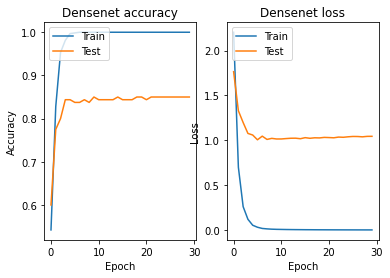

11/11 [==============================] - 3s 101ms/step - loss: 0.4417 - accuracy: 0.8924
Test loss: 0.44169777631759644
Test accuracy: 0.8924418687820435


In [77]:
plot_hist(history_densenet_model_a,'Densenet')
score_train(densenet_model_a,test_x_final_densenet,Y_test)

## KNN- Image Retrieval

Using resnet-50-a for feature extraction and KNN

In [78]:
from keras.models import Model

In [79]:
feature_model_vgg_model19_a= Model(inputs=vgg_model19_a.input, outputs=vgg_model19_a.get_layer('new_fc').output)

In [80]:
feature_vects=feature_model_vgg_model19_a.predict(train_x_final_vgg19)

In [81]:
feature_vects.shape

(640, 1024)

In [82]:
from sklearn.neighbors import KNeighborsClassifier as KNeighborsClassifier

In [83]:
from sklearn.model_selection import GridSearchCV

In [84]:
labels_integers=np.argmax(train_y_final, axis=1)

In [85]:
labels_integers.shape

(640,)

In [5]:
# note there is a difference betwweb knnclassifier and knn and KNeighbors 
# knnclassifiers and knn do the same predict the class labels while knnNeighbors predivt the n nearest neighbors 
# knnclassifier is a optimization of knn
# we have some more way to find similarities su ch as 
# Annoy: spotify
# FIASS:facebook
# SCANN:google
# they are really very fast at finding the nearest neighbors 

In [86]:
knn = KNeighborsClassifier()
knn.fit(feature_vects,labels_integers)

KNeighborsClassifier()

In [87]:
test_vects=feature_model_vgg_model19_a.predict(test_x_final_vgg19)

In [88]:
test_vects.shape

(344, 1024)

In [89]:
Y_test.shape

(344, 50)

In [90]:
test_label_integers=np.argmax(Y_test, axis=1)

In [91]:
test_label_integers.shape

(344,)

In [92]:
print(knn.score(test_vects,test_label_integers))


0.8023255813953488


RETREIVAL of FIRST 7 IMAGES

In [93]:
knn7 = KNeighborsClassifier(n_neighbors = 7)
knn7.fit(feature_vects,labels_integers)

KNeighborsClassifier(n_neighbors=7)

In [94]:
indices=knn7.kneighbors(test_vects, return_distance=False)

In [95]:
indices.shape

(344, 7)

In [96]:
np.max(indices)

639

In [97]:
np.min(indices)

1

In [98]:
def show_neighbors(orig, neighbors):
    f, axarr = plt.subplots(4, 2)
    for i, ax in enumerate(axarr.flatten()):
        if i == 0:
            ax.set_title("Query image")
            ax.imshow(orig)
        else:
            ax.set_title(f"Neighbor {i}")
            ax.imshow(train_x_final[neighbors[i-1]])
        ax.set_yticklabels([])
        ax.set_xticklabels([])
    plt.tight_layout()
    plt.show()

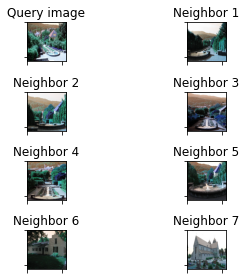

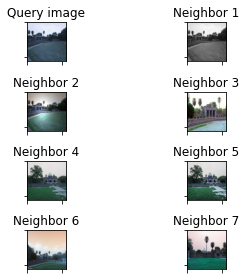

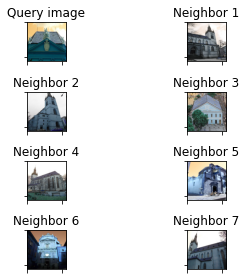

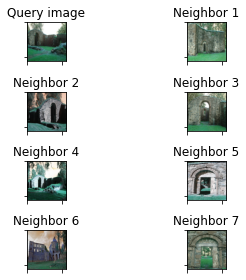

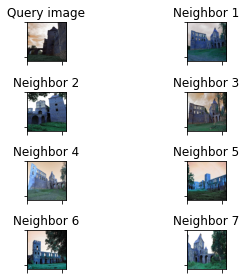

In [99]:
indices=knn7.kneighbors(test_vects, return_distance=False)
for i in range(0,5):
    show_neighbors(X_test[i],indices[i])
    
    

In [100]:
ypred=knn7.predict(test_vects)

In [101]:
from sklearn import metrics 
print(metrics.classification_report(test_label_integers,ypred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         2
           1       1.00      1.00      1.00         3
           2       1.00      0.50      0.67         6
           3       0.50      0.62      0.56         8
           4       0.71      0.71      0.71         7
           5       0.00      0.00      0.00         1
           6       0.75      0.60      0.67         5
           7       0.86      0.86      0.86         7
           8       0.25      1.00      0.40         1
           9       0.89      1.00      0.94       152
          10       0.50      1.00      0.67         1
          11       1.00      0.50      0.67         2
          12       0.89      1.00      0.94         8
          15       0.28      0.71      0.40         7
          16       0.80      0.50      0.62         8
          17       0.47      0.64      0.54        11
          18       0.50      1.00      0.67         1
          19       0.67    

/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1

Installing Xplique and utils

In [102]:
!pip install -q xplique

import os
import cv2
import numpy as np
import tensorflow as tf
from matplotlib import pyplot as plt

%matplotlib inline
%config InlineBackend.figure_format='retina'

import xplique
from xplique.plots import plot_attributions

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-io 0.21.0 requires tensorflow-io-gcs-filesystem==0.21.0, which is not installed.
explainable-ai-sdk 1.3.2 requires xai-image-widget, which is not installed.
dask-cudf 21.10.1 requires cupy-cuda114, which is not installed.
beatrix-jupyterlab 3.1.6 requires google-cloud-bigquery-storage, which is not installed.
tfx-bsl 1.5.0 requires absl-py<0.13,>=0.9, but you have absl-py 0.15.0 which is incompatible.
tfx-bsl 1.5.0 requires pyarrow<6,>=1, but you have pyarrow 6.0.1 which is incompatible.
tfx-bsl 1.5.0 requires tensorflow!=2.0.*,!=2.1.*,!=2.2.*,!=2.3.*,!=2.4.*,!=2.5.*,!=2.6.*,<3,>=1.15.2, but you have tensorflow 2.6.2 which is incompatible.
tensorflow-transform 1.5.0 requires absl-py<0.13,>=0.9, but you have absl-py 0.15.0 which is incompatible.
tensorflow-transform 1.5.0 requires pyarrow<6,>=1, but you 

In [103]:
print(X_train.shape)

(800, 224, 224, 3)


In [104]:
Y_train.shape

(800, 50)

Method: Saliency


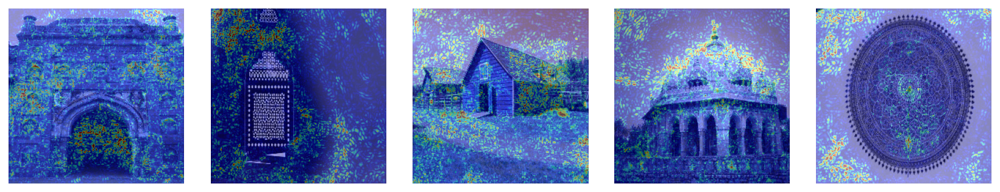



Method: GradientInput


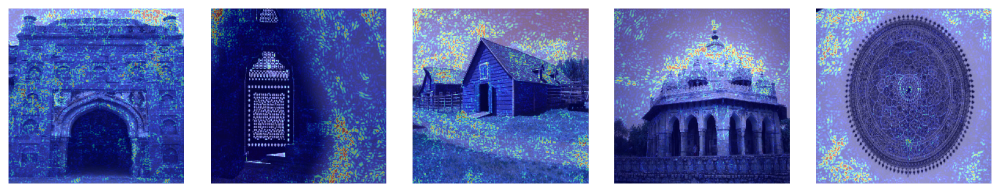



Method: GuidedBackprop


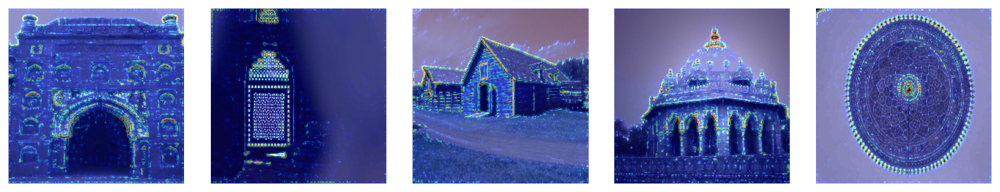



Method: IntegratedGradients


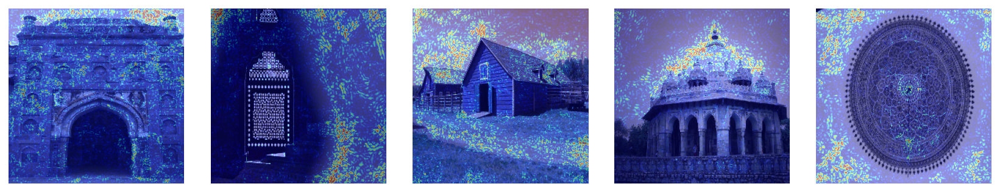



Method: SmoothGrad


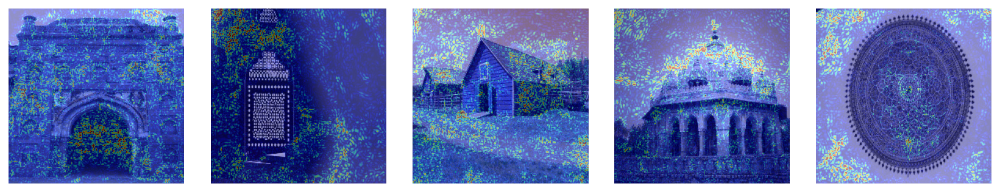



Method: SquareGrad


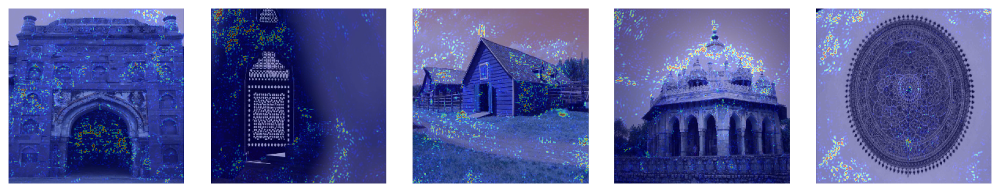



Method: VarGrad


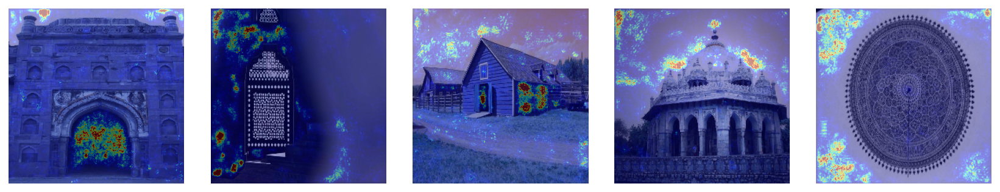



Method: GradCAM


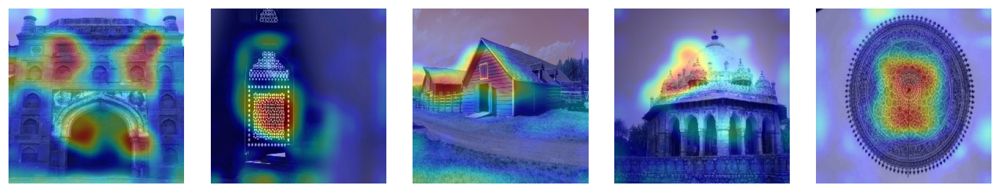



Method: GradCAMPP


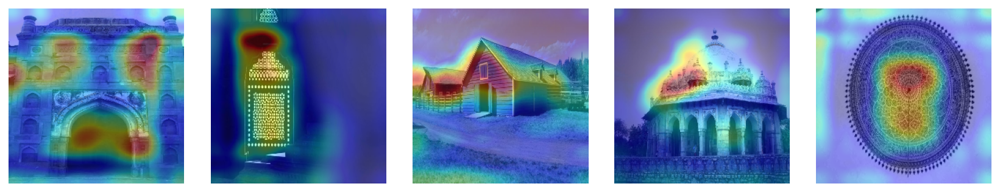



Method: Occlusion


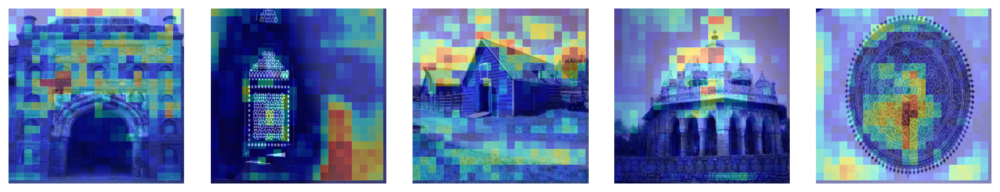



Method: SobolAttributionMethod


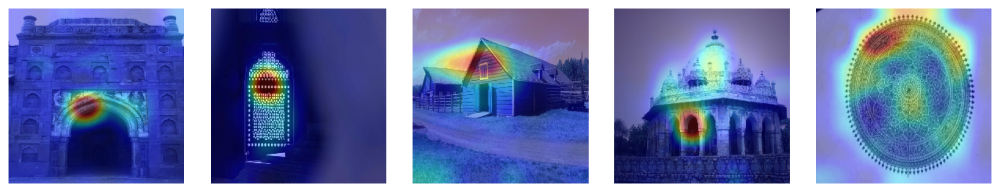

In [105]:
from xplique.attributions import (Saliency, GradientInput, IntegratedGradients, SmoothGrad, VarGrad,
                                  SquareGrad, GradCAM, Occlusion, Rise, GuidedBackprop,
                                  GradCAMPP, Lime, KernelShap, SobolAttributionMethod)

# model.layers[-1].activation = tf.keras.activations.linear: 
# This line modifies the activation function of the last layer of the model to a linear activation function. 
# This is done to ensure that explanations are generated based on logits rather than softmax probabilities.

model = vgg_model19_a
model.layers[-1].activation = tf.keras.activations.linear
batch_size = 64

explainers = [
             Saliency(model),
             GradientInput(model),
             GuidedBackprop(model),
             IntegratedGradients(model, steps=50, batch_size=batch_size),
             SmoothGrad(model, nb_samples=50, batch_size=batch_size),
             SquareGrad(model, nb_samples=50, batch_size=batch_size),
             VarGrad(model, nb_samples=50, batch_size=batch_size),
             GradCAM(model),
             GradCAMPP(model),
             Occlusion(model, patch_size=10, patch_stride=10, batch_size=batch_size),
             SobolAttributionMethod(model, batch_size=batch_size),
             Rise(model, nb_samples=4000, batch_size=batch_size),
             Lime(model, nb_samples = 1000),
             KernelShap(model, nb_samples = 1000)
]

explanations_to_test = {}

for explainer in explainers:

  explainer_name = explainer.__class__.__name__
  explanations = explainer(X_train, Y_train)

  if len(explanations.shape) > 3:
    explanations = np.mean(explanations, -1)

 
  explanations_to_test[explainer_name] = explanations
  
  print(f"Method: {explainer_name}")
  plot_attributions(explanations[:5], X_train[:5], cmap='jet', alpha=0.4,
                    cols=5, clip_percentile=0.5, absolute_value=True)
  plt.show()
  print("\n")